# Analysing topics with hSBM

In order to explore the content of the collected Wikipedia pages, we deploy a  hierarchical stochastic block model (hSBM). The model is used to identify prevalent topics in a text corpora, and it relies on integration of  teqniques used for community detection in networks (Gerlach et al. 2018). HSBM has proven to perform better than the more widely used latent Dirichlet allocation (LDA). Topics can be identified by the HSBM by representing the text corpora as a bipartite network in which nodes are documents and words, and the weight of the edges connecting nodes are determined by word-occurrences in each document. The model automatically detects the relevant number of topics and makes a hierarchical clustering of nodes (ibid.).

We were only able to run the hSBM in Google Colab. The code is attached and it can also be found through the link below. Through the hSBM we identifyied e list of topics and corresponding probabilities for each document to belong to a certain topic. We stored this information in a dataframe to be able to further analyse it in this notebook.

https://colab.research.google.com/drive/10_H2VPqhq69gVBz0nWEyC8aqVadAq9lc?usp=sharing

In [30]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

In [31]:
# We read the dataframes with data from HSBM 
topics=pd.read_csv('HSBM_topics_28.11.csv')
topics.drop('Unnamed: 0', axis = 'columns', inplace = True)
HSBM_probs=pd.read_csv('HSBM_probs_28.11.csv')
HSBM_probs.drop('Unnamed: 0', axis = 'columns', inplace = True)

**Plotting result of HSBM** <br>
We plot the word-document bipartite network generated thought hSBM. Document-nodes are on the left, and word-nodes are on the right. Colors correspond to the different groups. The nodes of words and documents are grouped on multiple levels.On the highest level (in the center of the graph) all nodes belong to the same group, on the second highest level the network is splot into word- and document-nodes. We are interested in the word-groups as these correspond to topics of the documents. The SBM has a hierarchical structure which implies that topics at the lowest levels (far to the right) contain more granular information about the content of the documents, whereas, topics at higher levels are clusters of the lower level topics and, thus, more aggregate (ref). 

The hSBM generates 416 topics at Level 0, 48 topics at Level 1, 7 topics at Level 2, and 2 topics at Level 3. We choose to work with topics at level 1 which we deem to be the most appropriate level to examine as the topics appear to be reasonably coherent and manageable to manually select from. A list of topics at all levels is attached in Appendix X.

The documents on the left side are sorted such that the disciplines appear alphabethically such that anthropologists are the first nodes and the last are sociologists. The number of documents vary within each discipline, and thus we show the order in the table below. From the graph below we can sense how the document-nodes seem to cluster in what might correspond to disciplinary groupings. This is sespecially true for the cluster document nodes in the bottom which could indicate a sociology group.

In [32]:
HSBM_probs

,name,discipline,community,text,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47
0,A. H. J. Prins,anth,1,"['adriaan', 'hendrik', 'johan', 'generally', '...",0.060332,0.018100,0.072398,0.019608,0.075415,0.055807,0.043741,0.107089,0.057315,0.016591,0.015083,0.049774,0.013575,0.036199,0.003017,0.001508,0.016591,0.054299,0.016591,0.018100,0.013575,0.015083,0.012066,0.007541,0.016591,0.010558,0.025641,0.006033,0.007541,0.004525,0.016591,0.003017,0.012066,0.021116,0.004525,0.022624,0.009050,0.001508,0.006033,0.018100,0.003017,0.006033,0.006033,0.000000,0.000000,0.000000,0.000000,0.000000
1,Adam Kuper,anth,1,"['adam', 'jonathan', 'born', 'december', '1941...",0.020690,0.027586,0.051724,0.024138,0.075862,0.079310,0.062069,0.086207,0.055172,0.006897,0.020690,0.086207,0.003448,0.041379,0.010345,0.000000,0.017241,0.034483,0.013793,0.010345,0.003448,0.006897,0.003448,0.003448,0.000000,0.003448,0.010345,0.003448,0.003448,0.010345,0.086207,0.000000,0.000000,0.020690,0.003448,0.024138,0.034483,0.003448,0.003448,0.010345,0.010345,0.006897,0.013793,0.003448,0.003448,0.000000,0.000000,0.000000
2,Alan Macfarlane,anth,6,"['alan', 'donald', 'born', 'december', '1941',...",0.055404,0.017257,0.039055,0.058129,0.058129,0.074478,0.100817,0.019074,0.031789,0.037239,0.008174,0.049955,0.006358,0.045413,0.004541,0.001817,0.006358,0.020890,0.016349,0.004541,0.005450,0.007266,0.006358,0.010899,0.000908,0.004541,0.014532,0.012716,0.004541,0.034514,0.027248,0.003633,0.001817,0.018165,0.003633,0.039964,0.064487,0.000908,0.007266,0.019982,0.009083,0.017257,0.002725,0.005450,0.001817,0.015441,0.003633,0.000000
3,Albert Buell Lewis,anth,1,"['june', '1867', '–', 'october', '1940', 'firs...",0.008086,0.045822,0.098383,0.045822,0.037736,0.064690,0.012129,0.163073,0.022911,0.008086,0.018868,0.103774,0.001348,0.028302,0.002695,0.000000,0.009434,0.018868,0.026954,0.006739,0.004043,0.004043,0.005391,0.002695,0.022911,0.001348,0.004043,0.017520,0.004043,0.000000,0.043127,0.000000,0.000000,0.066038,0.002695,0.021563,0.021563,0.000000,0.014825,0.004043,0.000000,0.017520,0.016173,0.000000,0.001348,0.001348,0.000000,0.000000
4,Alfred Gell,anth,1,"['alfred', 'antony', 'francis', 'june', '1945'...",0.062893,0.009434,0.062893,0.040881,0.044025,0.050314,0.062893,0.110063,0.015723,0.006289,0.018868,0.103774,0.003145,0.028302,0.009434,0.009434,0.012579,0.009434,0.009434,0.003145,0.003145,0.000000,0.003145,0.009434,0.000000,0.003145,0.006289,0.040881,0.009434,0.000000,0.012579,0.000000,0.000000,0.078616,0.006289,0.018868,0.059748,0.006289,0.022013,0.015723,0.006289,0.018868,0.000000,0.000000,0.003145,0.003145,0.000000,0.000000
5,Anthony F. C. Wallace,anth,1,"['anthony', 'francis', 'clarke', 'april', '192...",0.004769,0.015898,0.089030,0.027027,0.103339,0.076312,0.055644,0.081081,0.066773,0.007949,0.003180,0.077901,0.007949,0.044515,0.003180,0.000000,0.011129,0.007949,0.009539,0.014308,0.011129,0.015898,0.012719,0.001590,0.000000,0.011129,0.015898,0.003180,0.011129,0.001590,0.082671,0.001590,0.000000,0.023847,0.007949,0.019078,0.015898,0.000000,0.007949,0.009539,0.003180,0.020668,0.007949,0.000000,0.004769,0.000000,0.000000,0.003180
6,Anton Blok,anth,1,"['born', '1935', 'amsterdam', 'dutch', 'anthro...",0.018692,0.028037,0.065421,0.018692,0.018692,0.046729,0.149533,0.028037,0.065421,0.009346,0.000000,0.028037,0.000000,0.018692,0.000000,0.000000,0.009346,0.009346,0.009346,0.000000,0.009346,0.018692,0.009346,0.000000,0.009346,0.018692,0.018692,0.000000,0.009346,0.037383,0.112150,0.009346,0.056075,0.009346,0.056075,0.056075,0.000000,0.009346,0.000000,0.009346,0.000000,0.000000,0.000000,0.009346,0.000000,0.000000,0.018692,0.000000
7,Arthur Maurice Hocart,anth,5,"['april', '1883', 'etterbeek', 'belgium', '–',...",0.021318,0.011628,0.151163,0.021318,0.065891,0.094961,0.019380,0.098837,0.025194,0.019380,0.019380,0.100775,0.007752,0.034884,0.000000,0.005814,0.001938,0.007752,0.019380,0.011628,0.005814,0.005

In [33]:
# Showing the order and number of documents for each discipline as they appear in the graph below. 
pd.DataFrame(HSBM_probs.groupby(['discipline']).size())

,0
discipline,
anth,144
eco,825
multiple,86
pol,234
psy,300
soc,511


                 Bipartite network of documents and words


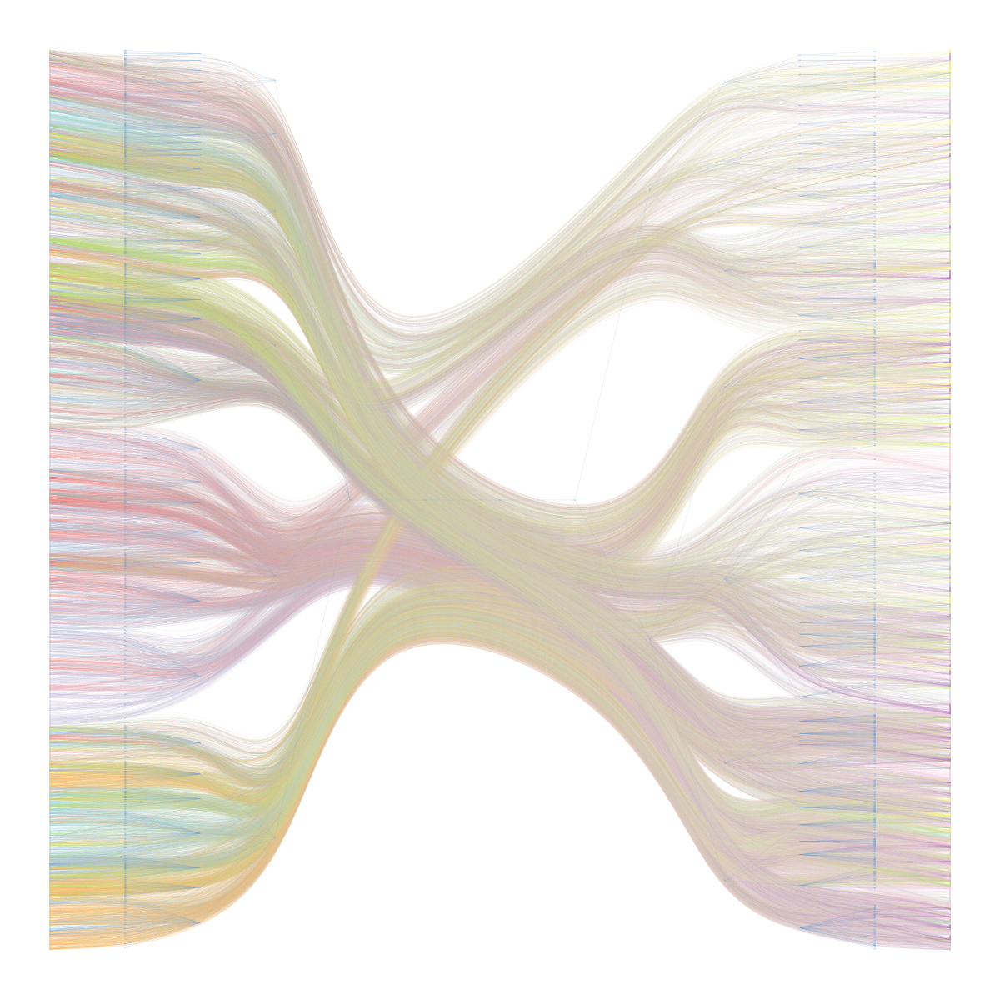

In [34]:
# We show the image of the bipartite network generated through th hSBM. 
print('                 Bipartite network of documents and words')
Image(filename = "hSBM_Topicmodel.png", width=600, height=600)


**Selecting relevant topics** <br>
The full list of topics generated at Level 1 appear in the dataframe below  

In [35]:
# Printing all rows in the dataframe of topics 
pd.set_option("display.max_rows", None, "display.max_columns", None)
topics

,Topic,Topic_words,Probability_of_word_in_topic
0,0,london,0.198140
1,0,cambridge,0.155829
2,0,oxford,0.118572
3,0,vol,0.089803
4,0,ed,0.072204
5,0,macmillan,0.029331
6,0,equality,0.021343
7,0,palgrave,0.015664
8,0,australia,0.015102
9,0,lse,0.014603


For each of the generated topics, we examine the 10 most probable words in order to select a subset of topics which we assess to be the most interesting to further examine. We draw on a heuristic approach which implies that we select topics that we assess to be semantically coherent and exclusive. Furthermore, we only select topics that we assess to be related to the content of the theoretical contributions of the researchers and we discard topics that appear to be related to academic prestige, timely relevans (topics consisting only of years), and nationality (topics consisting of city names and words in non-English languages). We select a subset of 21 topics which we give appropriate descriptive names.

In [36]:
# The final selected topics appear from the dictionary below with acribed names
topic_dict={'7': 'Anthropology',
            '10':'Human nature',
            '12': 'Foreign politics',
            '14': 'Trade and capitalism',
            '15': 'Science studies',
            '16': 'Cultural sociology',
            '17': 'Race',
            '19': 'War politics',
            '20': 'Measuring behavior',
            '25': 'Mentality and personality',
            '26': 'Conflict studies',
            '27':'Child/mother relations',
            '28':'Governing publics',
            '37':'Economics',
            '38':'Language studies',
            '39': 'Religious stories',
            '40': 'Market mechanisms',
            '41': 'Philosophy',
            '43': 'Power and classes',
            '44':'Cognitive psychology',
            '46': 'Democratic policymaking'}

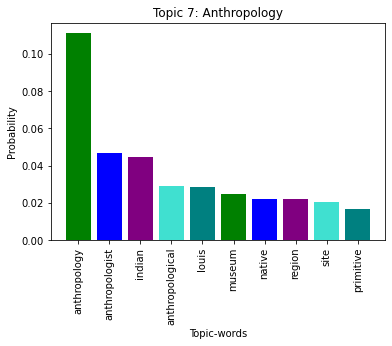

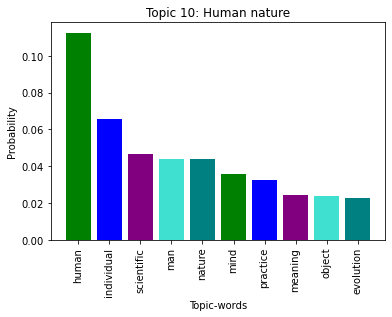

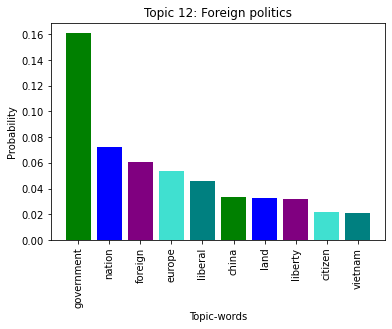

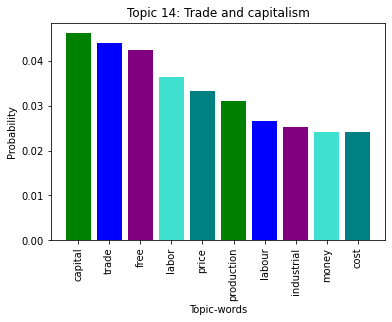

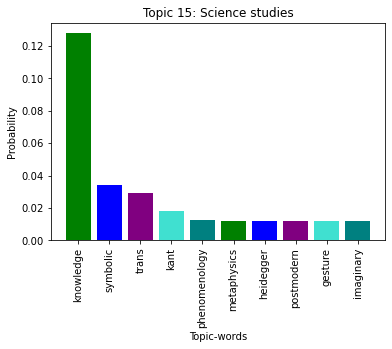

...

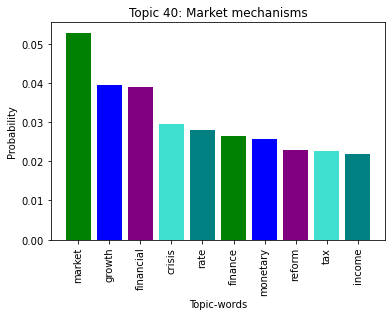

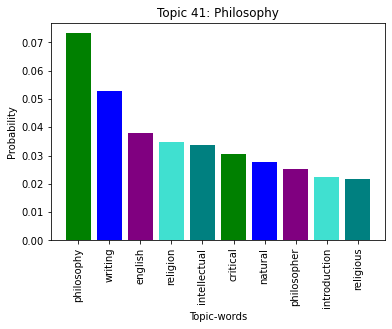

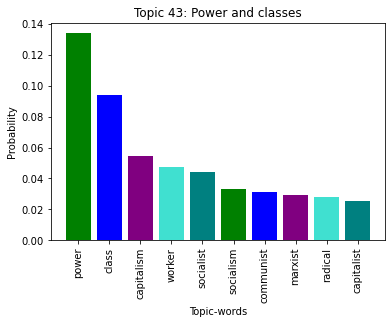

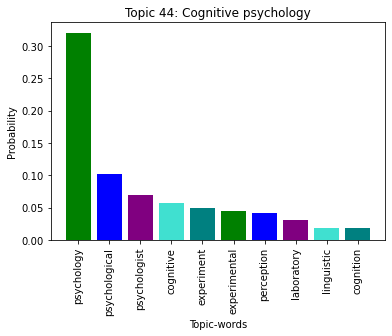

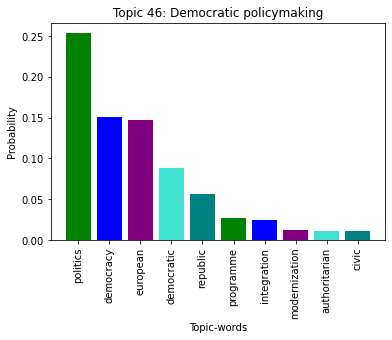

In [37]:
''' We create a barplot of the most important words within each of the selected topics '''

# We define the colors
color= ['green','blue','purple','turquoise','teal']

for i,t in topic_dict.items():
    
# We use the keys and values from the topic_dict to extract words and probabilities from the topic dataframe. 
# Words and word probabilities are then showed in a bar plot for each topic
    plt.bar(list(topics[topics['Topic']==int(i)]['Topic_words']),
            list(topics[topics['Topic']==int(i)]['Probability_of_word_in_topic']),color=color)
    plt.title('Topic {}: {}'.format(i,t))
    plt.xlabel('Topic-words')
    plt.ylabel('Probability')
    plt.xticks(rotation=90)
    plt.show()

**Examining distribution of topics by discipline** <br>
After having examined and selcted a subset of topics generated by the hSBM, we move on to find the distribution of each topic within the disciplines. By doing this, we want to find out whether the social scientists across different disciplines deal with the same topics or if their discipline bind them to certain topics. 

In [38]:
# I subset the 
HSBM_probs_topics=HSBM_probs[['name','discipline','community','text']+list(topic_dict.keys())]
HSBM_probs_topics=HSBM_probs_topics.rename(columns=topic_dict)
HSBM_probs_topics

,name,discipline,community,text,Anthropology,Human nature,Foreign politics,Trade and capitalism,Science studies,Cultural sociology,Race,War politics,Measuring behavior,Mentality and personality,Conflict studies,Child/mother relations,Governing publics,Economics,Language studies,Religious stories,Market mechanisms,Philosophy,Power and classes,Cognitive psychology,Democratic policymaking
0,A. H. J. Prins,anth,1,"['adriaan', 'hendrik', 'johan', 'generally', '...",0.107089,0.015083,0.013575,0.003017,0.001508,0.016591,0.054299,0.018100,0.013575,0.010558,0.025641,0.006033,0.007541,0.001508,0.006033,0.018100,0.003017,0.006033,0.000000,0.000000,0.000000
1,Adam Kuper,anth,1,"['adam', 'jonathan', 'born', 'december', '1941...",0.086207,0.020690,0.003448,0.010345,0.000000,0.017241,0.034483,0.010345,0.003448,0.003448,0.010345,0.003448,0.003448,0.003448,0.003448,0.010345,0.010345,0.006897,0.003448,0.003448,0.000000
2,Alan Macfarlane,anth,6,"['alan', 'donald', 'born', 'december', '1941',...",0.019074,0.008174,0.006358,0.004541,0.001817,0.006358,0.020890,0.004541,0.005450,0.004541,0.014532,0.012716,0.004541,0.000908,0.007266,0.019982,0.009083,0.017257,0.005450,0.001817,0.003633
3,Albert Buell Lewis,anth,1,"['june', '1867', '–', 'october', '1940', 'firs...",0.163073,0.018868,0.001348,0.002695,0.000000,0.009434,0.018868,0.006739,0.004043,0.001348,0.004043,0.017520,0.004043,0.000000,0.014825,0.004043,0.000000,0.017520,0.000000,0.001348,0.000000
4,Alfred Gell,anth,1,"['alfred', 'antony', 'francis', 'june', '1945'...",0.110063,0.018868,0.003145,0.009434,0.009434,0.012579,0.009434,0.003145,0.003145,0.003145,0.006289,0.040881,0.009434,0.006289,0.022013,0.015723,0.006289,0.018868,0.000000,0.003145,0.000000
5,Anthony F. C. Wallace,anth,1,"['anthony', 'francis', 'clarke', 'april', '192...",0.081081,0.003180,0.007949,0.003180,0.000000,0.011129,0.007949,0.014308,0.011129,0.011129,0.015898,0.003180,0.011129,0.000000,0.007949,0.009539,0.003180,0.020668,0.000000,0.004769,0.000000
6,Anton Blok,anth,1,"['born', '1935', 'amsterdam', 'dutch', 'anthro...",0.028037,0.000000,0.000000,0.000000,0.000000,0.009346,0.009346,0.000000,0.009346,0.018692,0.018692,0.000000,0.009346,0.009346,0.000000,0.009346,0.000000,0.000000,0.009346,0.000000,0.018692
7,Arthur Maurice Hocart,anth,5,"['april', '1883', 'etterbeek', 'belgium', '–',...",0.098837,0.019380,0.007752,0.000000,0.005814,0.001938,0.007752,0.011628,0.005814,0.000000,0.013566,0.013566,0.007752,0.000000,0.001938,0.021318,0.009690,0.015504,0.007752,0.001938,0.001938
8,Arturo Escobar (anthropologist),anth,5,"['born', '1952', 'colombianamerican', 'anthrop...",0.024730,0.013910,0.003091,0.001546,0.006182,0.007728,0.009274,0.001546,0.003091,0.001546,0.027821,0.003091,0.021638,0.003091,0.006182,0.009274,0.007728,0.013910,0.010819,0.001546,0.017002
9,Ashley Montagu,anth,1,"['montague', 'francis', 'ashley1905', '–', '19...",0.032895,0.066612,0.002467,0.004112,0.000000,0.005757,0.046875,0.009046,0.012336,0.013980,0.014803,0.023026,0.009046,0.000822,0.013158,0.005757,0.000822,0.022204,0.000000,0.001645,0.001645


In [39]:
HSBM_probs_discipline=HSBM_probs_topics.groupby('discipline',as_index=False).mean()
HSBM_probs_discipline

,discipline,community,Anthropology,Human nature,Foreign politics,Trade and capitalism,Science studies,Cultural sociology,Race,War politics,Measuring behavior,Mentality and personality,Conflict studies,Child/mother relations,Governing publics,Economics,Language studies,Religious stories,Market mechanisms,Philosophy,Power and classes,Cognitive psychology,Democratic policymaking
0,anth,2.152778,0.069735,0.017618,0.005998,0.004715,0.003909,0.009946,0.030162,0.013034,0.007704,0.007838,0.014622,0.014793,0.009920,0.001535,0.013858,0.013806,0.003746,0.017212,0.005248,0.003826,0.003294
1,eco,6.185455,0.002355,0.007387,0.010256,0.029019,0.001402,0.000555,0.007761,0.014680,0.008319,0.002655,0.010898,0.006697,0.034092,0.042980,0.003561,0.005900,0.052802,0.011865,0.006041,0.001346,0.003607
2,multiple,5.604651,0.014438,0.022924,0.007297,0.015868,0.005602,0.007689,0.011164,0.017145,0.011156,0.009569,0.019163,0.015405,0.012810,0.009968,0.010871,0.010586,0.009804,0.023943,0.013047,0.005424,0.007475
3,pol,9.705128,0.002314,0.007778,0.019290,0.005611,0.002129,0.002204,0.009002,0.028482,0.006698,0.003398,0.019093,0.007326,0.037741,0.003881,0.005459,0.007371,0.008362,0.011573,0.008824,0.001759,0.022648
4,psy,3.436667,0.003035,0.024729,0.002325,0.004466,0.003574,0.001949,0.010687,0.009098,0.035424,0.039031,0.009432,0.025575,0.010550,0.000567,0.026364,0.010611,0.004037,0.012636,0.002629,0.039064,0.001096
5,soc,4.692759,0.005484,0.014639,0.006225,0.007647,0.007890,0.025082,0.014465,0.015011,0.006837,0.006243,0.021331,0.011090,0.014092,0.003543,0.011242,0.008130,0.007102,0.022232,0.012886,0.002732,0.005957


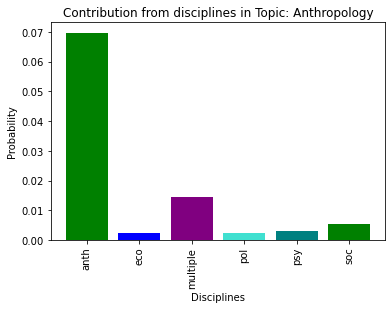

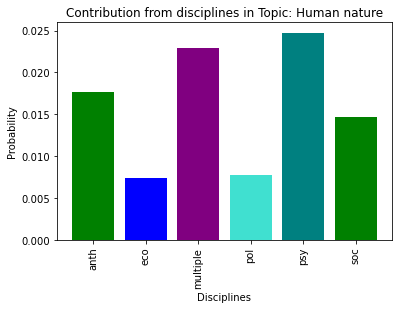

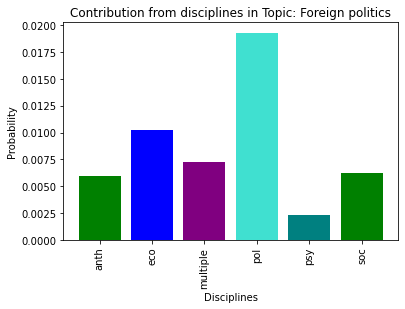

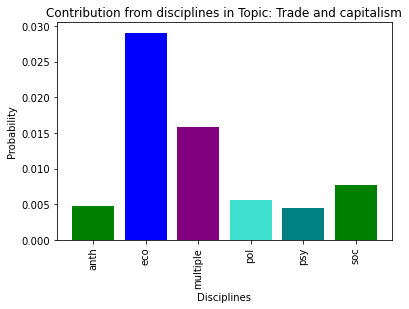

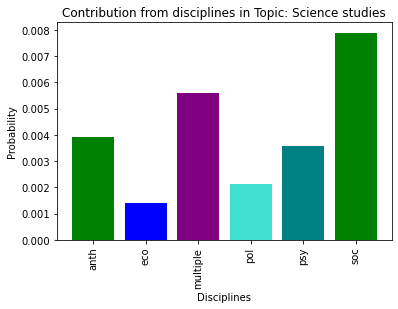

...

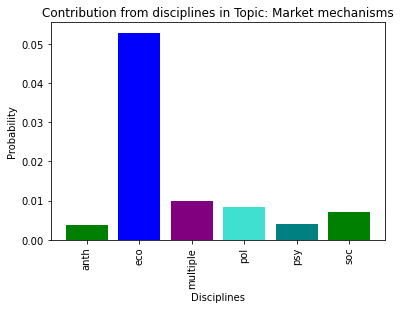

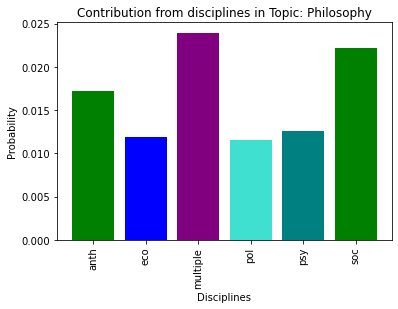

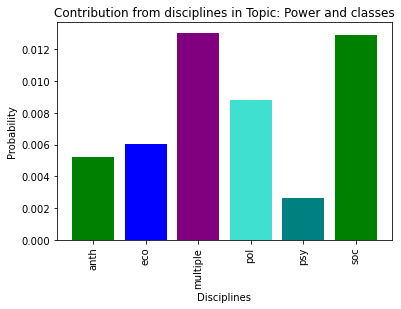

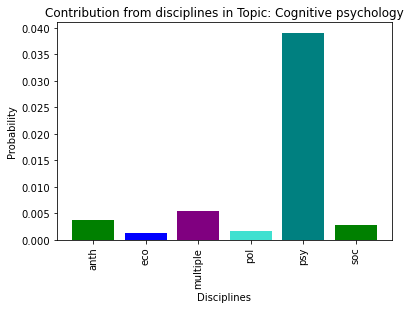

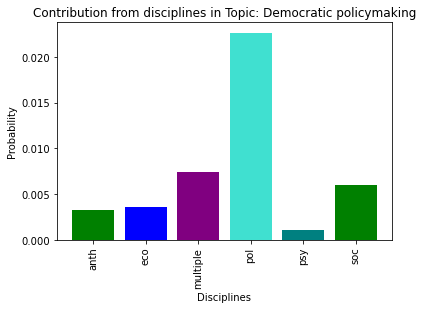

In [40]:
for topic in HSBM_probs_discipline.columns[2:]:
    plt.bar(HSBM_probs_discipline.discipline,HSBM_probs_discipline[topic],color=color)
    plt.title('Contribution from disciplines in Topic: {}'.format(topic))
    plt.xlabel('Disciplines')
    plt.ylabel('Probability')
    plt.xticks(rotation=90)
    plt.show()


In [41]:
ax?

In [46]:
fig?

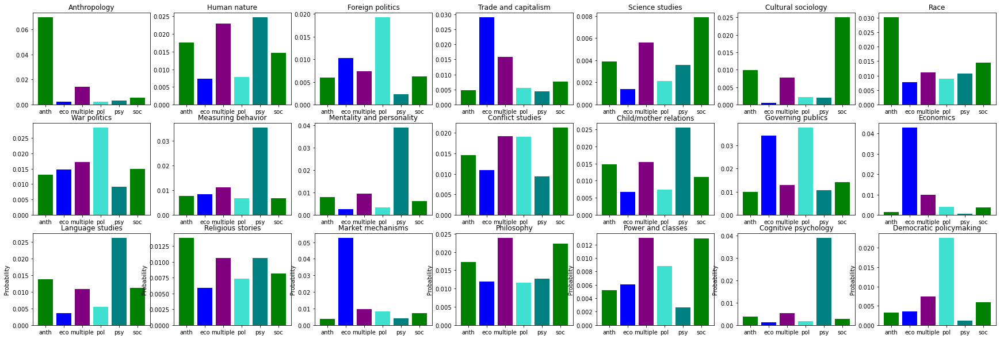

In [48]:
#### Kan nogen fixe det her???#####

fig, ax = plt.subplots(3, 7, figsize=(30, 10))

for i,topic in enumerate(HSBM_probs_discipline.columns[2:]):
    if i<7:
        ax[0,i].bar(HSBM_probs_discipline.discipline,HSBM_probs_discipline[topic],color=color)
        ax[0,i].set_title(topic)
    if i>=7 and i<14:
        i = i-7
        ax[1,i].bar(HSBM_probs_discipline.discipline,HSBM_probs_discipline[topic],color=color)
        ax[1,i].set_title(topic)
    if i>=14:
        i = i-14
        ax[2,i].bar(HSBM_probs_discipline.discipline,HSBM_probs_discipline[topic],color=color)
        ax[2,i].set_title(topic)
        ax[2,i].set_ylabel('Probability')


In [34]:
HSBM_probs_community=HSBM_probs_topics.groupby('community',as_index=False).mean()
HSBM_probs_community

,community,Anthropology,Human nature,Foreign politics,Trade and capitalism,Science studies,Cultural sociology,Race,War politics,Measuring behavior,Mentality and personality,Conflict studies,Child/mother relations,Governing publics,Economics,Language studies,Religious stories,Market mechanisms,Philosophy,Power and classes,Cognitive psychology,Democratic policymaking
0,0,0.002229,0.010118,0.001492,0.014115,0.004121,0.000202,0.003951,0.016578,0.022628,0.001281,0.005771,0.003452,0.020645,0.008338,0.000607,0.008991,0.009228,0.012169,0.001800,0.001598,0.004976
1,1,0.066224,0.017050,0.005968,0.004310,0.002651,0.012498,0.029721,0.014622,0.008787,0.006910,0.013878,0.013555,0.011585,0.001845,0.011718,0.013191,0.004760,0.015230,0.005120,0.003198,0.004058
2,2,0.003656,0.024476,0.002687,0.004426,0.002680,0.002670,0.010230,0.009561,0.036684,0.040293,0.009765,0.027017,0.010125,0.000902,0.023631,0.009948,0.004079,0.011697,0.002621,0.037368,0.001000
3,3,0.006281,0.015393,0.006300,0.007012,0.006671,0.026763,0.013491,0.012201,0.009247,0.006489,0.018367,0.010473,0.016519,0.004387,0.012685,0.006860,0.007361,0.013991,0.007819,0.004441,0.007778
4,4,0.002200,0.006913,0.010683,0.025098,0.000996,0.000852,0.010902,0.015443,0.009180,0.003980,0.010660,0.007093,0.046196,0.043407,0.003972,0.004252,0.058682,0.007945,0.004831,0.001775,0.004193
5,5,0.008721,0.014886,0.007597,0.011375,0.008720,0.014315,0.013127,0.019302,0.006266,0.006993,0.022475,0.011160,0.013405,0.007089,0.011727,0.009029,0.009867,0.023269,0.019282,0.003332,0.009088
6,6,0.004062,0.017913,0.009264,0.021055,0.005075,0.004963,0.008550,0.015477,0.008993,0.006784,0.021527,0.014870,0.015351,0.013217,0.010940,0.017074,0.013223,0.037916,0.008885,0.008123,0.004361
7,7,0.002744,0.007065,0.008281,0.028564,0.001378,0.001139,0.006601,0.010538,0.009710,0.002537,0.007525,0.006109,0.028688,0.044406,0.003931,0.004009,0.054511,0.007260,0.004026,0.002797,0.003165
8,8,0.005074,0.007142,0.013555,0.008189,0.001831,0.007794,0.023730,0.016936,0.004170,0.003024,0.026924,0.012350,0.028802,0.000718,0.004748,0.005219,0.008175,0.012586,0.006477,0.000480,0.018186
9,9,0.001802,0.015652,0.006453,0.006017,0.005566,0.023963,0.004225,0.004140,0.002637,0.001137,0.013062,0.004814,0.018009,0.007599,0.004977,0.003962,0.007189,0.005924,0.011477,0.001179,0.027701


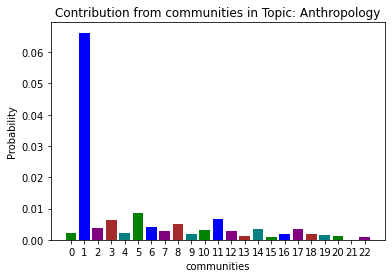

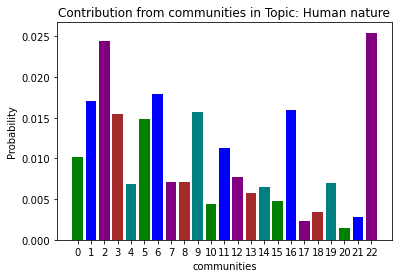

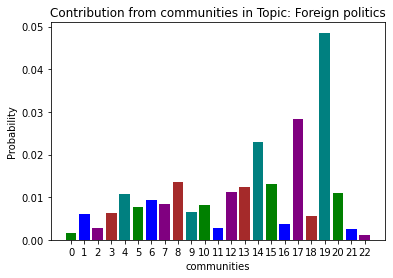

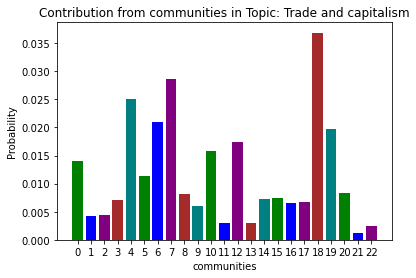

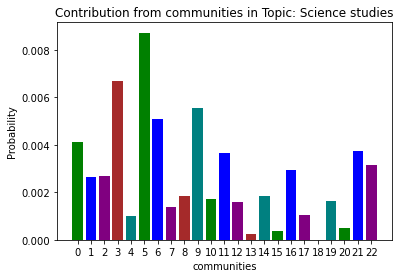

...

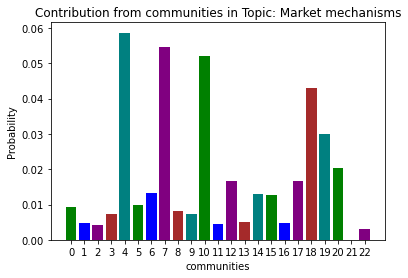

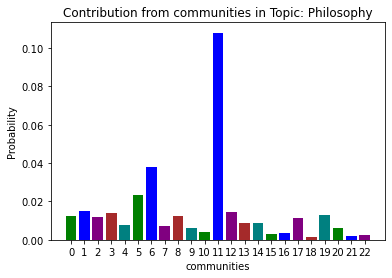

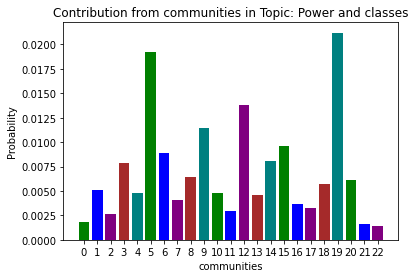

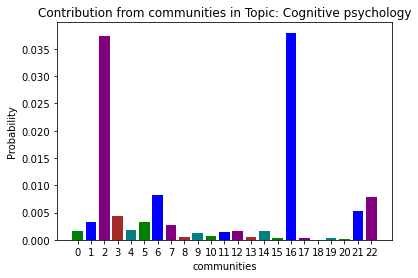

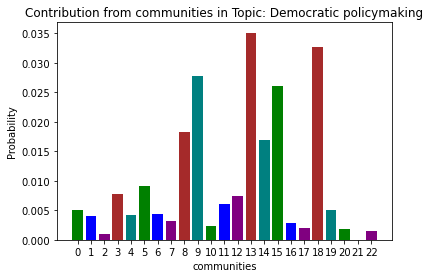

In [128]:
for i,topic in enumerate(HSBM_probs_community.columns[1:]):
    plt.bar(HSBM_probs_community.community,HSBM_probs_community[topic],color= ['green','blue','purple','brown','teal'])
    plt.title('Contribution from communities in Topic: {}'.format(topic))
    plt.xlabel('communities')
    plt.ylabel('Probability')
    plt.xticks(range(23))
    plt.show()
